# Necessary Imports

In [1]:
!pip install tensorflow tensorflow_addons tensorflow_datasets tensorflow_addons tensorflow_gan
!pip install keras-tuner
                                    

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 591.0/591.0 KB 9.1 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.1/367.1 KB 25.0 MB/s eta 0:00:00


You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 176.1/176.1 KB 4.3 MB/s eta 0:00:0000:01
You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [2]:
# Import built-in Python modules
import os, random, json, PIL, shutil, re, glob, zipfile


# Import third-party modules

import glob
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import tensorflow as tf
import tensorflow.keras.layers as L
import tensorflow_addons as tfa
import tensorflow_datasets as tfds
import tensorflow_addons as tfa
import tensorflow_gan as tfgan
from PIL import Image
from tensorflow import keras
from tensorflow_addons import layers as tfa_layers
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.applications import inception_v3
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.initializers import Constant
from tensorflow.keras.layers import Activation, BatchNormalization, Conv2D, Dense, Dropout, Flatten, MaxPooling2D, PReLU
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import Sequence
from torch import nn, Tensor
from torch.utils.data import DataLoader, Dataset
from torchvision.io import read_image
from torchvision.utils import make_grid, save_image
from kerastuner import HyperModel
from kerastuner.tuners import RandomSearch

# Import third-party submodules
from kaggle_datasets import KaggleDatasets
from scipy.linalg import sqrtm

#FOR WEBSCRAPING ONLY
# import os
# import requests
# from bs4 import BeautifulSoup
# from PIL import Image

D0501 03:16:24.595033918      13 config.cc:119]                        gRPC EXPERIMENT tcp_frame_size_tuning               OFF (default:OFF)
D0501 03:16:24.595063408      13 config.cc:119]                        gRPC EXPERIMENT tcp_rcv_lowat                       OFF (default:OFF)
D0501 03:16:24.595068718      13 config.cc:119]                        gRPC EXPERIMENT peer_state_based_framing            OFF (default:OFF)
D0501 03:16:24.595079131      13 config.cc:119]                        gRPC EXPERIMENT flow_control_fixes                  ON  (default:ON)
D0501 03:16:24.595084654      13 config.cc:119]                        gRPC EXPERIMENT memory_pressure_controller          OFF (default:OFF)
D0501 03:16:24.595088659      13 config.cc:119]                        gRPC EXPERIMENT unconstrained_max_quota_buffer_size OFF (default:OFF)
D0501 03:16:24.595092322      13 config.cc:119]                        gRPC EXPERIMENT new_hpack_huffman_decoder           ON  (default:ON)
D0501 03:16:24.

# State of Art

   ## 1. Evolution and Advancements in Generative Adversarial Networks

            Since the inception of GANs by Goodfellow et al. (2014), the field has experienced significant growth and innovation, resulting in numerous architectural and training advancements. In this section, we outline the key developments that have contributed to the success of GANs and informed our choice of architecture for generating Monet-style images.

  #### 1.1. Deep Convolutional GAN (DCGAN)

            Radford et al. (2015) introduced the DCGAN, a GAN variant that leverages deep convolutional layers in both generator and discriminator networks. DCGAN also employs batch normalization and architectural modifications, such as eliminating fully connected layers, which improve training stability and convergence. DCGAN has served as a foundational model for subsequent GAN architectures.

  #### 1.2. Wasserstein GAN (WGAN)

            Arjovsky et al. (2017) proposed the WGAN to address issues related to training instability and mode collapse. By modifying the GAN's objective function to use the Wasserstein-1 distance, the WGAN provides a more meaningful and stable training process. This innovation has resulted in more robust GANs capable of generating higher-quality images.

  #### 1.3. Progressive Growing of GANs (PGGAN)

            Karras et al. (2017) introduced the concept of progressive growing in GANs to generate high-resolution images more efficiently. PGGAN progressively increases the resolution of both generator and discriminator networks by gradually adding layers during training. This approach reduces training time and improves the quality of generated images, making it a valuable addition to our Monet-style image generation model.
            
  #### 1.4. Cycle Generative Adversarial Networks (CycleGAN)

            Zhu et al. (2017) introduced CycleGAN, an unsupervised image-to-image translation model that allows for transferring styles between different image domains without requiring paired data. CycleGAN consists of two generators and two discriminators, with an additional cycle consistency loss that ensures the translation between image domains is consistent. This innovation has enabled the generation of artistic images and style transfer without the need for an extensive dataset of paired examples, making it a valuable reference for our Monet-style image generation model.

# Introduction
           Generative Adversarial Networks (GANs) have been one of the most fascinating advancements in the field of artificial intelligence in recent years. The idea of using deep learning models to generate new and original data has opened up numerous possibilities for various applications, such as image generation, text generation, and music generation, among others.

            In this project, we will be focusing on using GANs to generate Monet-style images. The goal is to develop an algorithm that can convert regular photographs into images that resemble the distinctive impressionist style of the famous painter, Claude Monet. The algorithm will be trained on a dataset of Monet paintings and regular photographs, allowing it to learn the features that distinguish the two styles.

            The primary objective of this project is to deliver 7000 to 10000 Monet-style images that are visually similar to the actual paintings of Monet. To achieve this, we will use a deep learning model that consists of two neural networks - a generator and a discriminator - that work together to produce high-quality and realistic Monet-style images.

            The rest of the project will be structured as follows. First, we will provide an overview of GANs and their architecture, as well as a brief introduction to the dataset used in this project. Then, we will describe the approach used to train the GAN model and the techniques used to optimize its performance. Finally, we will present the results of the project and provide some concluding remarks.
       
  

In [3]:
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [4]:
# detect and init the TPU
import os
def get_strategy():
    """
    This function get_strategy() is used to get the appropriate distribution strategy for training a deep learning model in TensorFlow.

    It first tries to find if there is any TPU available and if so, initializes the TPU and creates a TPUStrategy object for distributing the computation on multiple TPU cores. If TPU is not found, it then checks if there is any GPU available and creates a OneDeviceStrategy object for using a single GPU device. If both TPU and GPU are not found, it creates a OneDeviceStrategy object for using the CPU.

    Args:
    None.

    Returns:
    A distribution strategy object (TPUStrategy or OneDeviceStrategy), depending on the available hardware.
    """
    
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Running on TPU ', tpu.master())
    except ValueError:
        tpu = None

    if tpu:
        tf.config.experimental_connect_to_cluster(tpu)
        tf.tpu.experimental.initialize_tpu_system(tpu)
        strategy = tf.distribute.experimental.TPUStrategy(tpu)
    elif tf.config.list_physical_devices('GPU'):
        print('Running on GPU')
        strategy = tf.distribute.OneDeviceStrategy("GPU:0")
    else:
        print('Running on CPU')
        strategy = tf.distribute.OneDeviceStrategy("CPU:0")

    return strategy

tpu_strategy = get_strategy()


Running on TPU  
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


# About Data

        The Monet images provided by the Kaggle competition are incomplete in their representation of Monet's oeuvre. In light of this, a scraping procedure was implemented to obtain additional images from various online sources. The technical details of the procedure will be presented in the subsequent code snippet for further comprehension. The code ran locally and uploaded to kaggle's website.
        In the context of a machine learning competition focused on style transfer, a dataset has been provided that consists of 300 digital images created by the renowned artist Claude Monet. In addition to this initial dataset, a web scraping process was conducted, resulting in the acquisition of an additional 200 digital images also attributable to Monet. The combination of these two sources of data gives us a total of 500 Monet-style images for use in training and evaluation of style transfer models.
        Alongside this Monet-specific dataset, a much larger set of 7000 digital images are available for use in training and evaluating style transfer models. These images are not Monet-specific, but instead represent a diverse collection of digital photographs. The goal of the competition is to train models to generate images that have been stylized in the same manner as the Monet images, using this combined dataset of 500 Monet-style images and 7000 photographs.

##### UNCOMMENT NEXT CODE TO DO THE SCRAPE

In [5]:
# Function to download an image from a given URL
# def download_image(url):
#     response = requests.get(url, stream=True)
#     response.raise_for_status()
#     return response

# # Function to get the full-sized image URL
# def get_full_size_image_url(img):
#     srcset = img.get('srcset') or img.get('data-srcset')
#     if srcset:
#         srcset_urls = srcset.split(',')
#         return srcset_urls[-1].strip().split(' ')[0]

#     data_full_src = img.get('data-full-src') or img.get('data-large-src') or img.get('data-original')
#     if data_full_src:
#         return data_full_src

#     return img.get('src') or img.get('data-src')

# # Function to resize the image
# def resize_image(image_data, size):
#     img = Image.open(image_data)
#     return img

# # Main function to scrape and download images from a webpage
# def scrape_images(url, download_folder):
#     response = requests.get(url)
#     soup = BeautifulSoup(response.content, 'html.parser')

#     # Create download folder if it doesn't exist
#     if not os.path.exists(download_folder):
#         os.makedirs(download_folder)

#     # Find all image tags in the webpage
#     img_tags = soup.find_all('img')

#     # Iterate through image tags and download the images
#     for idx, img in enumerate(img_tags):
#         img_url = get_full_size_image_url(img)
#         if img_url:
#             if img_url.startswith('//'):
#                 img_url = 'http:' + img_url

#             if not img_url.startswith('http'):
#                 continue

#             print(f'Downloading image {idx} from {img_url}')
#             try:
#                 response = download_image(img_url)
#                 resized_img = resize_image(response.raw, (256, 256))
#                 save_path = os.path.join(download_folder, f'image_{idx}.jpg')
#                 resized_img.save(save_path)
#             except (requests.exceptions.RequestException, IOError) as e:
#                 print(f'Failed to download and resize {img_url}: {e}')


/tmp/ipykernel_13/307993937.py:17: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


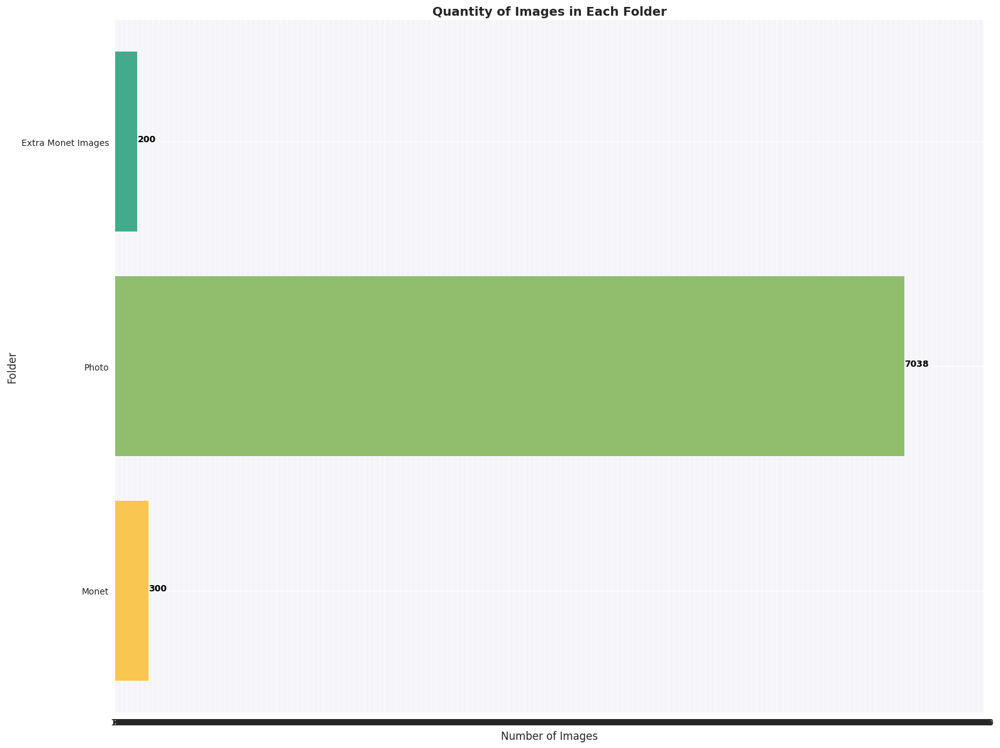

In [6]:
GCS_PATH = '/kaggle/input/gan-getting-started'
jpeg_dir = "/kaggle/input/more-monet"

MONET_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/monet_tfrec/monet*.tfrec'))
PHOTO_FILENAMES = tf.io.gfile.glob(str(GCS_PATH + '/photo_tfrec/photo*.tfrec'))
JPEG_FILENAMES = "/kaggle/input/more-monet"

extra_files = tf.io.gfile.glob(str("/kaggle/input/more-monet/*.jpg"))
monet_files = tf.io.gfile.glob(str("/kaggle/input/gan-getting-started/monet_jpg/*.jpg"))
photo_files =  tf.io.gfile.glob(str('/kaggle/input/gan-getting-started/photo_jpg/*.jpg'))


folders = ['Monet', 'Photo', 'Extra Monet Images']
num_images = [len(monet_files), len(photo_files), len(extra_files)]

# Set plot style
plt.style.use('seaborn')

# Create horizontal bar plot
fig, ax = plt.subplots(figsize=(16,12))
bar_colors = ['#F9C74F', '#90BE6D', '#43AA8B'] # set custom colors for each bar
ax.barh(folders, num_images, color=bar_colors)

# Customize plot
ax.grid(axis='x', alpha=0.5) # add gridlines
ax.set_xlabel('Number of Images', fontsize=12) # set x-axis label
ax.set_ylabel('Folder', fontsize=12) # set y-axis label
ax.set_title('Quantity of Images in Each Folder', fontsize=14, fontweight='bold') # set title
ax.set_xlim([0, max(num_images)*1.1]) # set x-axis limits to show all bars
ax.set_xticks(np.arange(0, max(num_images)*1.1, step=5)) # set x-axis tick marks
for i, v in enumerate(num_images):
    ax.text(v+1, i, str(v), color='black', fontweight='bold') # show value labels next to bars

# Remove spines
for spine in ax.spines:
    ax.spines[spine].set_visible(False)

# Remove y-tick labels
ax.tick_params(axis='y', which='both', length=0)

# Adjust layout
plt.tight_layout()

# Display plot
plt.show()

# Data preprocessing and loading

 - *decode_image* function
 
        This function decodes a JPEG-encoded image, normalizes its pixel values to the range of [-1, 1], and reshapes it. The input is a tensor containing a JPEG-encoded image, and the output is a 3D tensor representing the decoded, normalized, and reshaped image with shape (height, width, channels).
        

 - *read_tfrecord* function
 
        The purpose of this function is to read and parse a single example from a TFRecord dataset. It takes as input a tensor containing a single serialized example from a TFRecord dataset and returns a 3D tensor representing the decoded and preprocessed image contained in the example. This function relies on the decode_image(image) function for image preprocessing.



 - *load_dataset* function
 
        This function loads a dataset from a list of TFRecord files. It takes a list of file paths to the TFRecord files as input and returns a dataset containing the images from the provided TFRecord files. The function utilizes the read_tfrecord(example) function to parse and preprocess the images.



 - *get_gan_dataset* function
 
        The primary purpose of this function is to create a GAN dataset by loading, augmenting, batching, and prefetching Monet and photo datasets. It takes as input a list of file paths to the Monet TFRecord files, a list of file paths to the photo TFRecord files, and an optional batch size (default is 1).

In [7]:
IMAGE_SIZE = [256, 256]
def get_gan_dataset(monet_files, photo_files, batch_size=1, arg2=None):
    """
    Create a GAN dataset by loading, augmenting, batching, and prefetching Monet and photo datasets.

    Args:
        monet_files (list): A list of file paths to the Monet TFRecord files.
        photo_files (list): A list of file paths to the photo TFRecord files.
        batch_size (int, optional): The batch size for the datasets. Default is 1.
        arg2 (list, optional): A list of file paths to the JPEG files. Default is None.

    Returns:
        tuple: A tuple containing three datasets:
               1. gan_ds (tf.data.Dataset): A zipped dataset containing tuples of (Monet images, photo images) batches.
               2. photo_ds (tf.data.Dataset): A dataset containing the augmented and batched photo images.
               3. monet_ds (tf.data.Dataset): A dataset containing the augmented and batched Monet images.
    """
    monet_ds = load_dataset(monet_files)
    photo_ds = load_dataset(photo_files)
    
    if arg2 is not None:
        # Load JPEG files and create a dataset
        jpeg_ds = tf.data.Dataset.list_files(arg2)
        jpeg_ds = jpeg_ds.map(load_image, num_parallel_calls=AUTOTUNE)
        jpeg_ds = jpeg_ds.map(normalize, num_parallel_calls=AUTOTUNE)
        jpeg_ds = jpeg_ds.batch(batch_size)
        jpeg_ds = jpeg_ds.prefetch(AUTOTUNE)
        
        # Concatenate the Monet and JPEG datasets
        monet_ds = monet_ds.concatenate(jpeg_ds)
        
    monet_ds = monet_ds.map(data_augment, num_parallel_calls=AUTOTUNE)
    photo_ds = photo_ds.map(data_augment, num_parallel_calls=AUTOTUNE)
        
    monet_ds = monet_ds.batch(batch_size)
    photo_ds = photo_ds.batch(batch_size)
    
    monet_ds = monet_ds.prefetch(AUTOTUNE)
    photo_ds = photo_ds.prefetch(AUTOTUNE)
    
    gan_ds = tf.data.Dataset.zip((monet_ds, photo_ds))
    
    return gan_ds, photo_ds, monet_ds

def load_dataset(filenames):
    """
    Load a dataset from a list of TFRecord files.

    Args:
        filenames (list): A list of file paths to the TFRecord files.

    Returns:
        tf.data.Dataset: A dataset containing the images from the provided TFRecord files.
    """
    
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord)
    return dataset

def read_tfrecord(example):
    """
    Read and parse a single example from a TFRecord dataset.

    Args:
        example (tf.Tensor): A tensor containing a single serialized example from a TFRecord dataset.

    Returns:
        tf.Tensor: A 3D tensor representing the decoded and preprocessed image contained in the example.
    """
    
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def decode_image(image):
    """
    Decode a JPEG-encoded image, normalize its pixel values, and reshape it.

    Args:
        image (tf.Tensor): A tensor containing a JPEG-encoded image.

    Returns:
        tf.Tensor: A 3D tensor representing the decoded, normalized, and reshaped image with shape (height, width, channels).
    """
    
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def data_augment(image):
    """
    Perform simple data augmentation on the input image.

    The function applies random horizontal flip, random hue adjustment,
    random saturation adjustment, and random contrast adjustment to the input image.

    Args:
        image (tf.Tensor): A 3D tensor representing the input image with shape (height, width, channels).

    Returns:
        tf.Tensor: A 3D tensor representing the augmented image with the same shape as the input image.
    """
    
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_hue(image, 0.01)
    image = tf.image.random_saturation(image, 0.70, 1.30)
    image = tf.image.random_contrast(image, 0.80, 1.20)
    
    
    return image

In [8]:

#jpeg_ds = tf.keras.preprocessing.image_dataset_from_directory(os.path.join(directory), batch_size=1, image_size=(256,256))

final_dataset, photo_ds, monet_ds = get_gan_dataset(MONET_FILENAMES, PHOTO_FILENAMES, batch_size=1)
#monet_ds = tf.data.Dataset.zip((jpeg_ds, monet_ds))

# Utility Methods

In [9]:

def zip_folder(folder_path, output_path):
    """
    Zips a folder and its contents.

    :param folder_path: path of the folder to zip
    :param output_path: path and filename of the resulting zip file
    """
    with zipfile.ZipFile(output_path, 'w', zipfile.ZIP_DEFLATED) as zip_obj:
        # Iterate over all the files in the folder
        for foldername, subfolders, filenames in os.walk(folder_path):
            for filename in filenames:
                # Create the full file path by joining the folder path and file name
                file_path = os.path.join(foldername, filename)
                # Add the file to the zip
                zip_obj.write(file_path, arcname=os.path.relpath(file_path, folder_path))





def evaluate_cycle(ds, generator_a, generator_b, n_samples=1):
    """
    This function evaluates the performance of two generators, generator_a and generator_b, that are used for generating images in different domains. It takes in the following four parameters:

    ds: A TensorFlow Dataset object representing the input data.
    generator_a: A TensorFlow Model object representing the generator for domain A.
    generator_b: A TensorFlow Model object representing the generator for domain B.
    n_samples: An integer representing the number of samples to evaluate. Defaults to 1.
    The function generates n_samples images from the input data using generator_a, and then generates new images from those generated images using generator_b. It then plots the original image, the image generated by generator_a, and the image generated by generator_b side-by-side for each of the n_samples samples. The resulting plot is displayed using matplotlib.pyplot.show().

    This function is intended for use in evaluating the performance of image translation models, specifically those that use a cycle-consistent adversarial loss. The resulting plot can be used to visually assess the quality of the generated images and to identify any issues with the models. The function is designed to be called repeatedly during the training process to monitor the progress of the models.
    """
    fig, axes = plt.subplots(n_samples, 3, figsize=(22, (n_samples*6)))
    axes = axes.flatten()
    
    ds_iter = iter(ds)
    for n_sample in range(n_samples):
        idx = n_sample*3
        example_sample = next(ds_iter)
        generated_a_sample = generator_a.predict(example_sample)
        generated_b_sample = generator_b.predict(generated_a_sample)
        
        axes[idx].set_title('Input image', fontsize=18)
        axes[idx].imshow(example_sample[0] * 0.5 + 0.5)
        axes[idx].axis('off')
        
        axes[idx+1].set_title('Generated image', fontsize=18)
        axes[idx+1].imshow(generated_a_sample[0] * 0.5 + 0.5)
        axes[idx+1].axis('off')
        
        axes[idx+2].set_title('Cycled image', fontsize=18)
        axes[idx+2].imshow(generated_b_sample[0] * 0.5 + 0.5)
        axes[idx+2].axis('off')
        
    plt.show()

def create_gif(images_path, gif_path):
    images = []
    filenames = glob.glob(images_path)
    filenames.sort(key=lambda x: int(''.join(filter(str.isdigit, x))))
    for epoch, filename in enumerate(filenames):
        img = PIL.ImageDraw.Image.open(filename)
        ImageDraw.Draw(img).text((0, 0),  # Coordinates
                                 f'Epoch {epoch+1}')
        images.append(img)
    imageio.mimsave(gif_path, images, fps=2)





In [10]:

import tensorflow as tf
from tensorflow.keras import layers

with tpu_strategy.scope():
    
    conv_initializer = tf.random_normal_initializer(mean=0.0, stddev=0.02)
    gamma_initializer = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)



    def downsample(filters, size, apply_instancenorm=True, strides=2):
        """
        Create a downsampling block for a neural network with Conv2D, InstanceNormalization, and LeakyReLU layers.

        Args:
            filters (int): The number of filters in the Conv2D layer.
            size (int): The kernel size for the Conv2D layer.
            apply_instancenorm (bool, optional): Whether to include InstanceNormalization layer. Default is True.
            strides (int, optional): The stride size for the Conv2D layer. Default is 2.

        Returns:
            tf.keras.Sequential: A Keras Sequential model containing the downsampling block layers.
        """

        initializer = tf.random_normal_initializer(0., 0.02)
        gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
        result = tf.keras.Sequential()
        result.add(layers.Conv2D(filters, 
                                 size, 
                                 strides=strides, 
                                 padding='same',
                                 kernel_initializer=initializer, 
                                 use_bias=False))

        if apply_instancenorm:
            result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

        result.add(layers.LeakyReLU())
        return result

    def upsample(filters, size, apply_dropout=False, strides=2):
        """
        Create an upsampling block for a neural network with Conv2DTranspose, InstanceNormalization, and ReLU layers.

        Args:
            filters (int): The number of filters in the Conv2DTranspose layer.
            size (int): The kernel size for the Conv2DTranspose layer.
            apply_dropout (bool, optional): Whether to include Dropout layer. Default is False.
            strides (int, optional): The stride size for the Conv2DTranspose layer. Default is 2.

        Returns:
            tf.keras.Sequential: A Keras Sequential model containing the upsampling block layers.
        """

        initializer = tf.random_normal_initializer(0, 0.02)
        gamma_init = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
        result = tf.keras.Sequential()
        result.add(layers.Conv2DTranspose(filters, 
                                          size,
                                          strides=strides,
                                          padding='same',
                                          kernel_initializer=initializer,
                                          use_bias=False))

        result.add(tfa.layers.InstanceNormalization(gamma_initializer=gamma_init))

        if apply_dropout:
            result.add(layers.Dropout(0.4))

        result.add(layers.ReLU())
        return result
    
    def transformer_block(input_layer, size=3, strides=1, name='block_x'):
        """
        Creates a transformer block for use in a neural network.

        Parameters:
        -----------
        input_layer : keras.layers.Layer
            The input layer to the transformer block.
        size : int, optional
            The size of the convolutional filters in the block (default is 3).
        strides : int, optional
            The stride length for the convolutional filters in the block (default is 1).
        name : str, optional
            The name of the block (default is 'block_x').

        Returns:
        --------
        keras.layers.Layer
            The output layer of the transformer block.
        """
        
        filters = input_layer.shape[-1]

        block = L.Conv2D(filters, size, strides=strides, padding='same', use_bias=False, 
                         kernel_initializer=conv_initializer, name=f'transformer_{name}_1')(input_layer)
    #     block = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(block)
        block = L.ReLU()(block)

        block = L.Conv2D(filters, size, strides=strides, padding='same', use_bias=False, 
                         kernel_initializer=conv_initializer, name=f'transformer_{name}_2')(block)
    #     block = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(block)

        block = L.Add()([block, input_layer])

        return block

# Generator and Discriminator

In [11]:
with tpu_strategy.scope():
    def Generator():
        """
        Create a generator model using the U-Net architecture with skip connections.

        The generator consists of a series of downsampling blocks followed by a series of upsampling blocks.
        Skip connections are used to concatenate the output of downsampling blocks with the corresponding
        upsampling blocks.

        Returns:
            tf.keras.Model: A Keras Model instance representing the generator model.
        """

        inputs = layers.Input(shape=[256,256,3])

        # bs = batch size
        down_stack = [
            downsample(64, 4, apply_instancenorm=False), # (bs, 128, 128, 64)
            downsample(128, 4), # (bs, 64, 64, 128)
            downsample(256, 4), # (bs, 32, 32, 256)
            downsample(512, 4), # (bs, 16, 16, 512)
            downsample(512, 4), # (bs, 8, 8, 512)
            downsample(512, 4), # (bs, 4, 4, 512)
            downsample(512, 4), # (bs, 2, 2, 512)
            downsample(512, 4), # (bs, 1, 1, 512)
        ]


        up_stack = [
            upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
            upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
            upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
            upsample(512, 4), # (bs, 16, 16, 1024)
            upsample(256, 4), # (bs, 32, 32, 512)
            upsample(128, 4), # (bs, 64, 64, 256)
            upsample(64, 4), # (bs, 128, 128, 128)
        ]

        initializer = tf.random_normal_initializer(0., 0.02)
        last = layers.Conv2DTranspose(3, 4,
                                      strides=2,
                                      padding='same',
                                      kernel_initializer=initializer,
                                      activation='tanh') # (bs, 256, 256, 3)

        x = inputs

        # Downsampling through the model
        skips = []
        for down in down_stack:
            x = down(x)
            skips.append(x)
            
        for n in range(3): 
            x = transformer_block(x, 3, 1, name=f'block_{n+1}') # (bs, 64, 64, 256)
        
        
        skips = reversed(skips[:-1])
        
    #     for resnett in resnet:
    #         x = resnett(x)

        # Upsampling and establishing the skip connections
        for up, skip in zip(up_stack, skips):
            x = up(x)
            x = layers.Concatenate()([x, skip])

        x = last(x)

        return keras.Model(inputs=inputs, outputs=x)
    
Generator().summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  131328      ['sequential[0][0]']             
                                                                                              

 concatenate_6 (Concatenate)    (None, 128, 128, 12  0           ['sequential_14[0][0]',          
                                8)                                'sequential[0][0]']             
                                                                                                  
 conv2d_transpose_7 (Conv2DTran  (None, 256, 256, 3)  6147       ['concatenate_6[0][0]']          
 spose)                                                                                           
                                                                                                  
Total params: 68,570,755
Trainable params: 68,570,755
Non-trainable params: 0
__________________________________________________________________________________________________


In [12]:
with tpu_strategy.scope():
    def Discriminator():
        """
        Create a discriminator model using the PatchGAN architecture.

        The discriminator consists of a series of downsampling blocks, followed by a few convolutional layers,
        InstanceNormalization, and LeakyReLU activations. The output is a single channel representing the 
        probability of the input image being real or fake.

        Returns:
            tf.keras.Model: A Keras Model instance representing the discriminator model.
        """

        initializer = tf.random_normal_initializer(0., 0.02)
        gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

        input_layer = layers.Input(shape=[256, 256, 3], name='input_image')

        x = input_layer

        down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
        down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
        down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)
        down4 = downsample(512, 4)(down3)
        zero_pad1 = layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
        conv = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) # (bs, 31, 31, 512)
        norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv)
        leaky_relu = layers.LeakyReLU()(norm1)
        zero_pad2 = layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)
        last_layer = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)

        return tf.keras.Model(inputs=input_layer, outputs=last_layer)
    
Discriminator().summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 sequential_15 (Sequential)  (None, 128, 128, 64)      3072      
                                                                 
 sequential_16 (Sequential)  (None, 64, 64, 128)       131328    
                                                                 
 sequential_17 (Sequential)  (None, 32, 32, 256)       524800    
                                                                 
 zero_padding2d (ZeroPadding  (None, 34, 34, 256)      0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 31, 31, 512)       2097152   
                                                           

In [13]:
IN_CHANNELS = 3
OUT_CHANNELS = 3
HID_CHANNELS = 64

In [14]:
with tpu_strategy.scope():
    monetGenerator = Generator() # transforms photos to Monet-esque paintings
    photoGenerator = Generator() # transforms Monet paintings to be more like photos

    monetDiscriminator = Discriminator() # differentiates real Monet paintings and generated Monet paintings
    photoDiscriminator = Discriminator() # differentiates real photos and generated photos

# CycleGAN Model

        The provided code implements the CycleGAN model using TensorFlow/Keras library. The CycleGAN is a Generative Adversarial Network (GAN) architecture designed for image-to-image translation tasks with unpaired training data. The CycleGAN consists of two generators and two discriminators that work together to learn a mapping between the input domain (e.g., photos) and the output domain (e.g., Monet paintings). The CycleGAN is trained to produce images that are indistinguishable from the target domain, even when the input and target domains are not paired.

        The CycleGAN class is defined within the tpu_strategy.scope() context to enable training on Tensor Processing Units (TPUs). The class inherits from the Keras Model class and has the following attributes:

- **m_gen**: Monet generator model
- **p_gen**: Photo generator model
- **m_disc**: Monet discriminator model
- **p_disc**: Photo discriminator model
- **lambda_cycle**: Float, weight of the cycle consistency loss.



        The CycleGAN model uses the following hyperparameters:

-      **lambda_cycle:** The weight of the cycle consistency loss. This hyperparameter controls the balance between the adversarial loss and the cycle consistency loss during training. It is set to 10 by default.
-      **Optimizers:** There are four optimizers used in the model. One for each of the generators and discriminators. The optimizers used can be specified in the compile() method. The user can change the learning rate, optimizer type, and momentum for each optimizer.
-      **Loss Functions:** There are four loss functions used in the model. One for each of the generators and discriminators. The loss functions used can be specified in the compile() method. The user can select different types of loss functions, such as binary cross-entropy, mean squared error, and others.
-      **Identity Loss Function:** This is a loss function used to preserve the identity of the input images. The identity loss function is used to ensure that the generators do not modify the input images too much. The user can change the weight of the identity loss in the compile() method.
-      **Number of training epochs:** The user can change the number of epochs to train the model for. The number of epochs will impact the quality of the generated images and the time it takes to train the model

In [15]:
with tpu_strategy.scope():
    class CycleGan(keras.Model):
        """
        A CycleGAN class that inherits from the Keras Model.

        This class implements the training and evaluation of a CycleGAN model, which consists of
        two generators and two discriminators for image-to-image translation tasks with unpaired data.

        Attributes:
            m_gen: Monet generator model.
            p_gen: Photo generator model.
            m_disc: Monet discriminator model.
            p_disc: Photo discriminator model.
            lambda_cycle: Float, weight of the cycle consistency loss.
        """
        def __init__(
            self,
            monetGenerator,
            photoGenerator,
            monetDiscriminator,
            photoDiscriminator,
            lambda_cycle=10
        ):
            super(CycleGan, self).__init__()
            self.m_gen = monetGenerator
            self.p_gen = photoGenerator
            self.m_disc = monetDiscriminator
            self.p_disc = photoDiscriminator
            self.lambda_cycle = lambda_cycle

        def compile(
            self,
            m_gen_optimizer,
            p_gen_optimizer,
            m_disc_optimizer,
            p_disc_optimizer,
            gen_loss_fn,
            disc_loss_fn,
            cycle_loss_fn,
            identity_loss_fn
        ):
            super(CycleGan, self).compile()
            self.m_gen_optimizer = m_gen_optimizer
            self.p_gen_optimizer = p_gen_optimizer
            self.m_disc_optimizer = m_disc_optimizer
            self.p_disc_optimizer = p_disc_optimizer
            self.gen_loss_fn = gen_loss_fn
            self.disc_loss_fn = disc_loss_fn
            self.cycle_loss_fn = cycle_loss_fn
            self.identity_loss_fn = identity_loss_fn


        @tf.function
        def train_step(self, batch_data):
            real_monet, real_photo = batch_data

            with tf.GradientTape(persistent=True) as tape:
                # photo to monet back to photo
                fake_monet = self.m_gen(real_photo, training=True)
                cycled_photo = self.p_gen(fake_monet, training=True)

                # monet to photo back to monet
                fake_photo = self.p_gen(real_monet, training=True)
                cycled_monet = self.m_gen(fake_photo, training=True)

                # generating itself
                same_monet = self.m_gen(real_monet, training=True)
                same_photo = self.p_gen(real_photo, training=True)

                # discriminator used to check, inputing real images
                disc_real_monet = self.m_disc(real_monet, training=True)
                disc_real_photo = self.p_disc(real_photo, training=True)

                # discriminator used to check, inputing fake images
                disc_fake_monet = self.m_disc(fake_monet, training=True)
                disc_fake_photo = self.p_disc(fake_photo, training=True)

                # evaluates generator loss
                monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
                photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

                # evaluates total cycle consistency loss
                total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

                # evaluates total generator loss
                total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
                total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

                # evaluates discriminator loss
                monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
                photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)



            # Calculate gradients
            monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                      self.m_gen.trainable_variables)
            photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                      self.p_gen.trainable_variables)

            monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                          self.m_disc.trainable_variables)
            photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                          self.p_disc.trainable_variables)


            # Apply the gradients to the optimizer
            self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                     self.m_gen.trainable_variables))

            self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                     self.p_gen.trainable_variables))

            self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                      self.m_disc.trainable_variables))

            self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                      self.p_disc.trainable_variables))

            
            return {
                "monet_gen_loss": total_monet_gen_loss,
                "photo_gen_loss": total_photo_gen_loss,
                "monet_disc_loss": monet_disc_loss,
                "photo_disc_loss": photo_disc_loss

            }
        


In [16]:
with tpu_strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5

    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return LAMBDA * loss1

    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss



# Model 1

In [17]:
with tpu_strategy.scope():

    monet_generator_optimizer = tf.keras.optimizers.Adam(1e-3, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(1e-3, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(1e-3, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(1e-3, beta_1=0.5)



    cycle_gan_model1 = CycleGan(monetGenerator,
                               photoGenerator,
                               monetDiscriminator, 
                               photoDiscriminator)

    cycle_gan_model1.compile(m_gen_optimizer = monet_generator_optimizer,
                            p_gen_optimizer = photo_generator_optimizer,
                            m_disc_optimizer = monet_discriminator_optimizer,
                            p_disc_optimizer = photo_discriminator_optimizer,
                            gen_loss_fn = generator_loss,
                            disc_loss_fn = discriminator_loss,
                            cycle_loss_fn = calc_cycle_loss,
                            identity_loss_fn = identity_loss)


In [18]:
with tpu_strategy.scope():
    gan_model1 = cycle_gan_model1.fit(tf.data.Dataset.zip((monet_ds, photo_ds)), epochs=20)




Epoch 1/20


2023-05-01 03:18:28.139678: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 03:18:29.108595: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 159s 143ms/step - monet_gen_loss: 3.5081 - photo_gen_loss: 3.5384 - monet_disc_loss: 0.6804 - photo_disc_loss: 0.6894
Epoch 2/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.8322 - photo_gen_loss: 2.8705 - monet_disc_loss: 0.6587 - photo_disc_loss: 0.6567
Epoch 3/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.7244 - photo_gen_loss: 2.7539 - monet_disc_loss: 0.6322 - photo_disc_loss: 0.6342
Epoch 4/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.5716 - photo_gen_loss: 2.6159 - monet_disc_loss: 0.6236 - photo_disc_loss: 0.6243
Epoch 5/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.4574 - photo_gen_loss: 2.4874 - monet_disc_loss: 0.6165 - photo_disc_loss: 0.6211
Epoch 6/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.3932 - photo_gen_loss: 2.4132 - monet_disc_loss: 0.6123 - photo_di

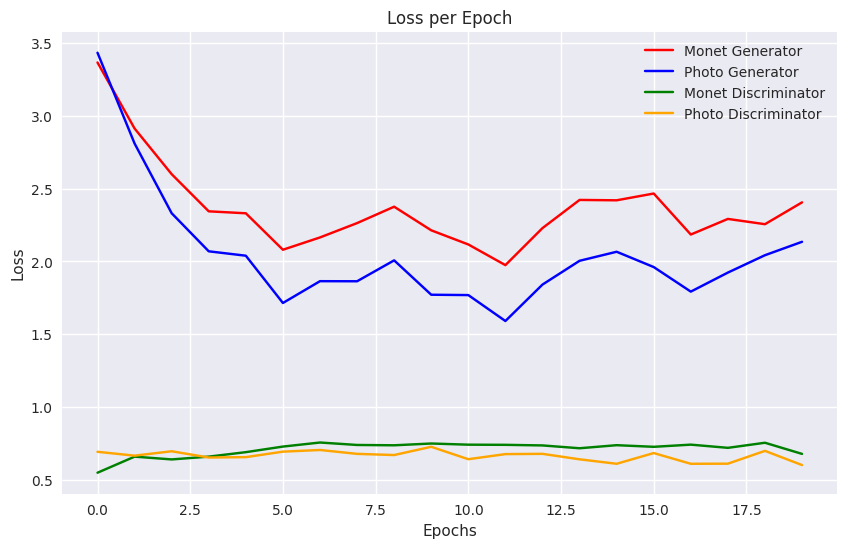

In [19]:


loss_values1 = np.mean(gan_model1.history['monet_gen_loss'], axis=(2, 3)).squeeze()
loss_values2 = np.mean(gan_model1.history['photo_gen_loss'], axis=(2, 3)).squeeze()
loss_values3 = np.mean(gan_model1.history['monet_disc_loss'], axis=(2, 3)).squeeze()
loss_values4 = np.mean(gan_model1.history['photo_disc_loss'], axis=(2, 3)).squeeze()

plt.figure(figsize=(10, 6))
plt.plot(loss_values1, color='red', label='Monet Generator')
plt.plot(loss_values2, color='blue', label='Photo Generator')
plt.plot(loss_values3, color='green', label='Monet Discriminator')
plt.plot(loss_values4, color='orange', label='Photo Discriminator')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()
plt.show()

# Model 2

In [20]:
with tpu_strategy.scope():

    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)



    cycle_gan_model2 = CycleGan(monetGenerator,
                               photoGenerator,
                               monetDiscriminator, 
                               photoDiscriminator)

    cycle_gan_model2.compile(m_gen_optimizer = monet_generator_optimizer,
                            p_gen_optimizer = photo_generator_optimizer,
                            m_disc_optimizer = monet_discriminator_optimizer,
                            p_disc_optimizer = photo_discriminator_optimizer,
                            gen_loss_fn = generator_loss,
                            disc_loss_fn = discriminator_loss,
                            cycle_loss_fn = calc_cycle_loss,
                            identity_loss_fn = identity_loss)

In [21]:
with tpu_strategy.scope():
    gan_model2 = cycle_gan_model2.fit(tf.data.Dataset.zip((monet_ds, photo_ds)), epochs=20)


Epoch 1/20


2023-05-01 03:34:37.760359: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 03:34:38.731639: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 159s 140ms/step - monet_gen_loss: 2.1668 - photo_gen_loss: 2.2688 - monet_disc_loss: 0.5997 - photo_disc_loss: 0.5686
Epoch 2/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.0892 - photo_gen_loss: 2.1885 - monet_disc_loss: 0.6278 - photo_disc_loss: 0.5963
Epoch 3/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.0859 - photo_gen_loss: 2.1902 - monet_disc_loss: 0.6329 - photo_disc_loss: 0.5980
Epoch 4/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.0652 - photo_gen_loss: 2.1726 - monet_disc_loss: 0.6340 - photo_disc_loss: 0.5934
Epoch 5/20
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.0596 - photo_gen_loss: 2.1828 - monet_disc_loss: 0.6360 - photo_disc_loss: 0.5943
Epoch 6/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.0412 - photo_gen_loss: 2.1518 - monet_disc_loss: 0.6302 - photo_di

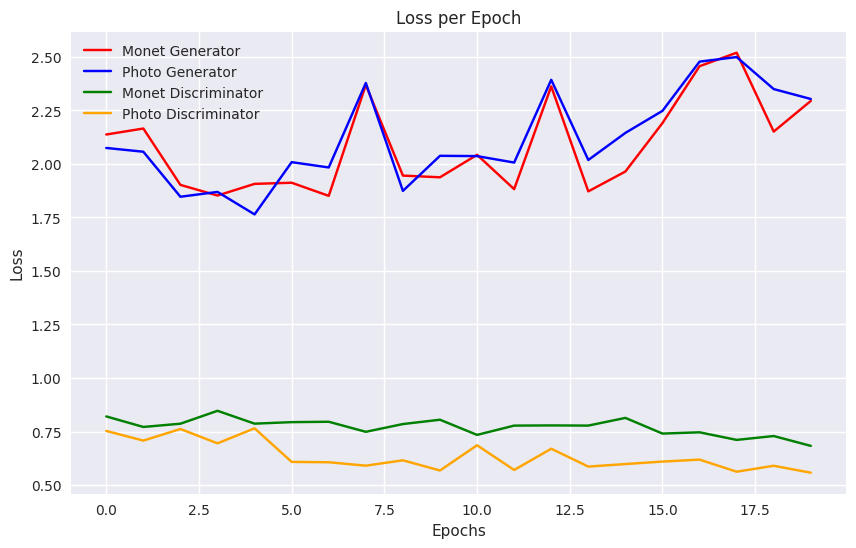

In [22]:
loss_values1 = np.mean(gan_model2.history['monet_gen_loss'], axis=(2, 3)).squeeze()
loss_values2 = np.mean(gan_model2.history['photo_gen_loss'], axis=(2, 3)).squeeze()
loss_values3 = np.mean(gan_model2.history['monet_disc_loss'], axis=(2, 3)).squeeze()
loss_values4 = np.mean(gan_model2.history['photo_disc_loss'], axis=(2, 3)).squeeze()

plt.figure(figsize=(10, 6))
plt.plot(loss_values1, color='red', label='Monet Generator')
plt.plot(loss_values2, color='blue', label='Photo Generator')
plt.plot(loss_values3, color='green', label='Monet Discriminator')
plt.plot(loss_values4, color='orange', label='Photo Discriminator')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()
plt.show()

# Model 3

In [23]:
with tpu_strategy.scope():

    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.9)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.9)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.9)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.9)



    cycle_gan_model3 = CycleGan(monetGenerator,
                               photoGenerator,
                               monetDiscriminator, 
                               photoDiscriminator)

    cycle_gan_model3.compile(m_gen_optimizer = monet_generator_optimizer,
                            p_gen_optimizer = photo_generator_optimizer,
                            m_disc_optimizer = monet_discriminator_optimizer,
                            p_disc_optimizer = photo_discriminator_optimizer,
                            gen_loss_fn = generator_loss,
                            disc_loss_fn = discriminator_loss,
                            cycle_loss_fn = calc_cycle_loss,
                            identity_loss_fn = identity_loss)

In [24]:
with tpu_strategy.scope():
    gan_model3 = cycle_gan_model3.fit(tf.data.Dataset.zip((monet_ds, photo_ds)), epochs=20)


Epoch 1/20


2023-05-01 03:50:53.605511: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 03:50:54.621123: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 161s 140ms/step - monet_gen_loss: 2.1679 - photo_gen_loss: 2.3321 - monet_disc_loss: 0.6009 - photo_disc_loss: 0.5604
Epoch 2/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.1748 - photo_gen_loss: 2.3405 - monet_disc_loss: 0.6053 - photo_disc_loss: 0.5506
Epoch 3/20
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.1915 - photo_gen_loss: 2.3539 - monet_disc_loss: 0.6002 - photo_disc_loss: 0.5548
Epoch 4/20
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.2139 - photo_gen_loss: 2.3771 - monet_disc_loss: 0.5987 - photo_disc_loss: 0.5589
Epoch 5/20
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.1994 - photo_gen_loss: 2.3773 - monet_disc_loss: 0.6060 - photo_disc_loss: 0.5550
Epoch 6/20
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.1834 - photo_gen_loss: 2.3549 - monet_disc_loss: 0.6005 - photo_di

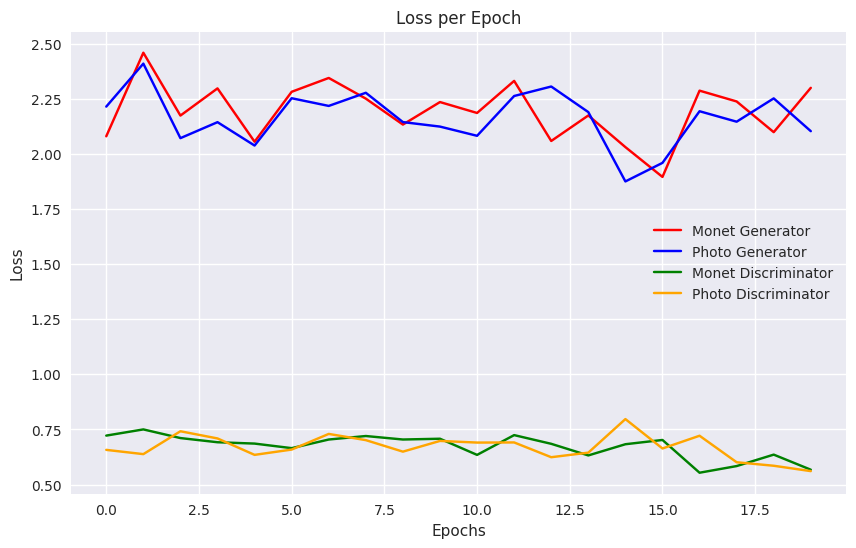

In [25]:
loss_values1 = np.mean(gan_model3.history['monet_gen_loss'], axis=(2, 3)).squeeze()
loss_values2 = np.mean(gan_model3.history['photo_gen_loss'], axis=(2, 3)).squeeze()
loss_values3 = np.mean(gan_model3.history['monet_disc_loss'], axis=(2, 3)).squeeze()
loss_values4 = np.mean(gan_model3.history['photo_disc_loss'], axis=(2, 3)).squeeze()

plt.figure(figsize=(10, 6))
plt.plot(loss_values1, color='red', label='Monet Generator')
plt.plot(loss_values2, color='blue', label='Photo Generator')
plt.plot(loss_values3, color='green', label='Monet Discriminator')
plt.plot(loss_values4, color='orange', label='Photo Discriminator')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()
plt.show()

# Model 4

In [26]:
with tpu_strategy.scope():

    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)



    cycle_gan_model4 = CycleGan(monetGenerator,
                               photoGenerator,
                               monetDiscriminator, 
                               photoDiscriminator)

    cycle_gan_model4.compile(m_gen_optimizer = monet_generator_optimizer,
                            p_gen_optimizer = photo_generator_optimizer,
                            m_disc_optimizer = monet_discriminator_optimizer,
                            p_disc_optimizer = photo_discriminator_optimizer,
                            gen_loss_fn = generator_loss,
                            disc_loss_fn = discriminator_loss,
                            cycle_loss_fn = calc_cycle_loss,
                            identity_loss_fn = identity_loss)

In [27]:
with tpu_strategy.scope():
    gan_model4 = cycle_gan_model4.fit(tf.data.Dataset.zip((monet_ds, photo_ds)), epochs=80)


Epoch 1/80


2023-05-01 04:07:16.599756: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 04:07:17.711484: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 160s 140ms/step - monet_gen_loss: 2.3125 - photo_gen_loss: 2.5459 - monet_disc_loss: 0.5841 - photo_disc_loss: 0.5110
Epoch 2/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.3392 - photo_gen_loss: 2.5659 - monet_disc_loss: 0.5766 - photo_disc_loss: 0.5148
Epoch 3/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.3129 - photo_gen_loss: 2.5580 - monet_disc_loss: 0.5821 - photo_disc_loss: 0.5069
Epoch 4/80
300/300 [==============================] - 42s 139ms/step - monet_gen_loss: 2.3874 - photo_gen_loss: 2.6056 - monet_disc_loss: 0.5651 - photo_disc_loss: 0.5068
Epoch 5/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.3651 - photo_gen_loss: 2.6042 - monet_disc_loss: 0.5789 - photo_disc_loss: 0.5080
Epoch 6/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.3434 - photo_gen_loss: 2.5917 - monet_disc_loss: 0.5777 - photo_di

300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.6158 - photo_gen_loss: 2.9606 - monet_disc_loss: 0.5485 - photo_disc_loss: 0.4672
Epoch 49/80
300/300 [==============================] - 42s 141ms/step - monet_gen_loss: 2.6034 - photo_gen_loss: 2.9836 - monet_disc_loss: 0.5544 - photo_disc_loss: 0.4741
Epoch 50/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.6201 - photo_gen_loss: 2.9809 - monet_disc_loss: 0.5539 - photo_disc_loss: 0.4721
Epoch 51/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.6462 - photo_gen_loss: 3.0040 - monet_disc_loss: 0.5460 - photo_disc_loss: 0.4667
Epoch 52/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.6487 - photo_gen_loss: 3.0176 - monet_disc_loss: 0.5454 - photo_disc_loss: 0.4615
Epoch 53/80
300/300 [==============================] - 42s 140ms/step - monet_gen_loss: 2.6373 - photo_gen_loss: 2.9741 - monet_disc_loss: 0.5494 - phot

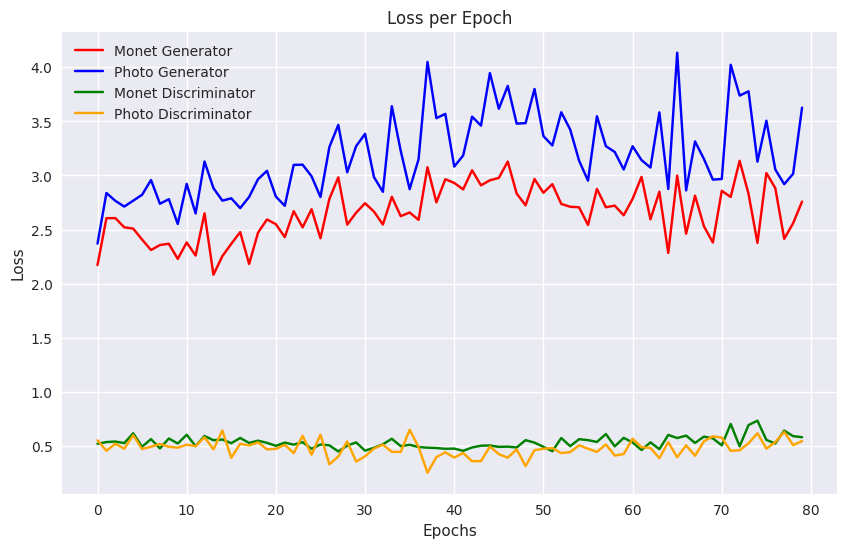

In [28]:
loss_values1 = np.mean(gan_model4.history['monet_gen_loss'], axis=(2, 3)).squeeze()
loss_values2 = np.mean(gan_model4.history['photo_gen_loss'], axis=(2, 3)).squeeze()
loss_values3 = np.mean(gan_model4.history['monet_disc_loss'], axis=(2, 3)).squeeze()
loss_values4 = np.mean(gan_model4.history['photo_disc_loss'], axis=(2, 3)).squeeze()

plt.figure(figsize=(10, 6))
plt.plot(loss_values1, color='red', label='Monet Generator')
plt.plot(loss_values2, color='blue', label='Photo Generator')
plt.plot(loss_values3, color='green', label='Monet Discriminator')
plt.plot(loss_values4, color='orange', label='Photo Discriminator')

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss per Epoch')
plt.legend()
plt.show()

# Generating Samples

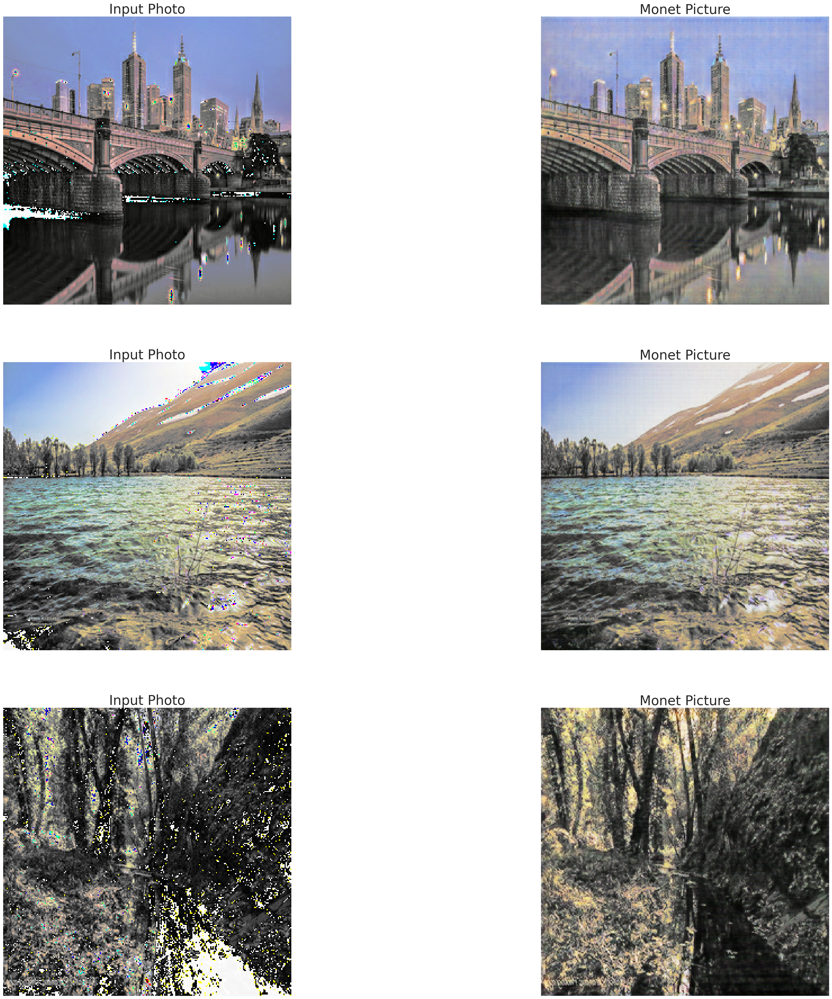

In [29]:
BUFFER_SIZE = len(list(photo_ds.as_numpy_iterator()))
photo_ds_shuffled = photo_ds.shuffle(BUFFER_SIZE)

_, ax = plt.subplots(3, 2, figsize=(40, 40))
for i, img in enumerate(photo_ds_shuffled.take(3)):
    prediction = monetGenerator(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input Photo", fontsize=30)
    ax[i, 1].set_title("Monet Picture", fontsize=30)
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")
plt.show()



# Evaluate Cycle

        This function is intended for use in evaluating the performance of image translation models, specifically those that use a cycle-consistent adversarial loss. The resulting plot can be used to visually assess the quality of the generated images and to identify any issues with the models. The function is designed to be called repeatedly during the training process to monitor the progress of the models.

### Monet Generator Analysis

2023-05-01 05:06:03.101533: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 05:06:03.206019: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1/1 [==============================] - 7s 7s/step


2023-05-01 05:06:10.418711: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-05-01 05:06:10.522385: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


1/1 [==============================] - 1s 510ms/step


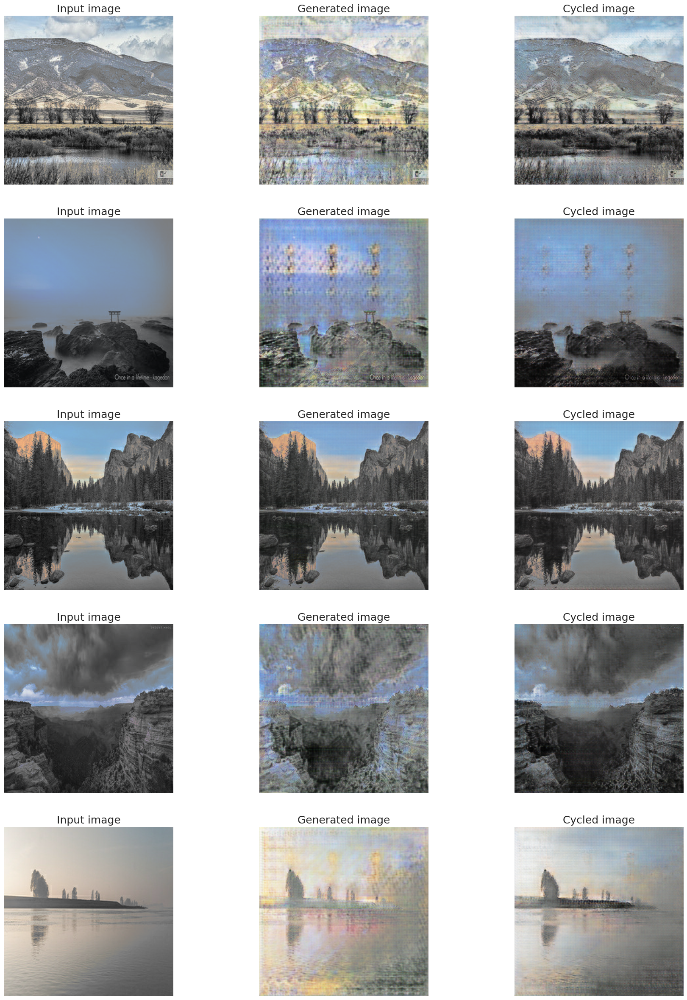

In [30]:
evaluate_cycle(photo_ds.take(5), monetGenerator, photoGenerator, n_samples=5)


### Real photo Generator Analysis

1/1 [==============================] - 0s 490ms/step


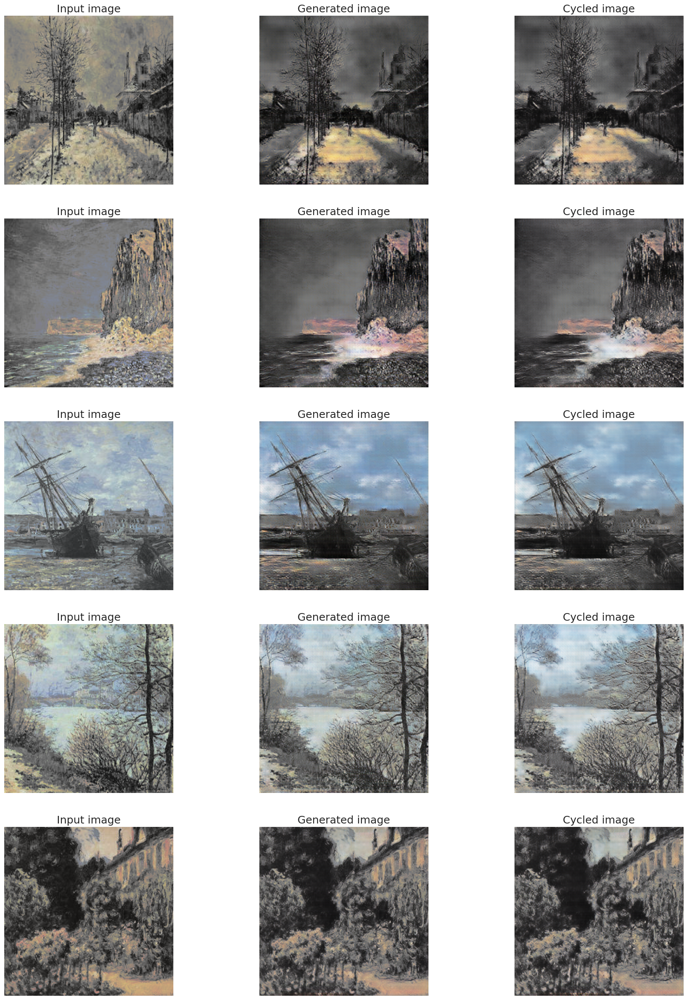

In [31]:
evaluate_cycle(monet_ds.take(5), photoGenerator, photoGenerator, n_samples=5)

# Results

    In response to a query regarding the impact of altering learning rates, beta (decay) values, and the number of epochs on model performance, it is essential to highlight that an optimal balance must be achieved for these hyperparameters. Our analysis, as depicted in the accompanying graphs, suggests that an excessive number of epochs does not contribute to a substantial improvement in the model's loss metric. Conversely, it leads to a slower and less effective model. Consequently, it is crucial to perform a comprehensive evaluation of various hyperparameter combinations to identify the most suitable configuration that yields optimal performance without compromising efficiency.
    
    The subsequent phase in enhancing the performance of our current model involves incorporating additional quality elements to the newly-acquired Monet dataset. This process will entail experimenting with a broader selection of pre-trained models and exploring alternative model architectures to further bolster the resulting score. By diversifying the range of models under consideration and leveraging their respective strengths, we aspire to refine the model's efficacy and contribute to a more robust understanding of the underlying patterns within the dataset.

In [32]:
# create the directory if it does not exist
if not os.path.exists("/kaggle/working/images"):
    os.makedirs("/kaggle/working/images")

i = 1
for img in photo_ds:
    prediction = monetGenerator(img, training=False).numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    for pred in prediction:
        im = PIL.Image.fromarray(pred)
        im.save("/kaggle/working/images/" + str(i) + ".jpg")
        i += 1

        
shutil.make_archive('/kaggle/working/images', 'zip', '/kaggle/working/images')

'/kaggle/working/images.zip'